In [621]:
import pandas as pd
import seaborn as sns
import numpy as np
import geocoder
import gmaps
import statsmodels.api as sm

import pytz

import psycopg2

from sklearn.linear_model import Ridge

import spacy

import swifter

import requests

import vincent

from io import StringIO

import altair as alt
from vega_datasets import data

In [622]:
# Plot settings
%pylab inline

figsize(15, 9)

import matplotlib.style as style

style.use('childsafeai')

alt.renderers.enable('default')

Populating the interactive namespace from numpy and matplotlib


/home/rspectre/.virtualenvs/jupyter/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['source', 'long']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


RendererRegistry.enable('default')

In [623]:
from local_settings import GOOGLE_API_KEY

gmaps.configure(GOOGLE_API_KEY)

# Supply Chain Risk

## Processing

In [624]:
# Grab 30,000 warehousese from Reonomy

warehouses = requests.get("https://www.reonomy.com/properties/geosearch?nw_lat=56.808103545962894&nw_lon=-175&se_lat=17&se_lon=-71.59679843434361&land_use=warehouse&size=30000").json()

In [625]:
processed_warehouses = []

for warehouse in warehouses:
    property_id = warehouse['property_id']
    lat = warehouse['location']['lat']
    long = warehouse['location']['lon']
    
    processed_warehouses.append({'property_id': property_id,
                                 'latitude': lat,
                                 'longitude': long})

In [626]:
warehouses = pd.DataFrame(processed_warehouses)
warehouses

,property_id,latitude,longitude
0,cd899813-c893-5705-9f75-f039393ce07c,38.981038396896146,-84.60000458303602
1,caaca9ce-dd89-55df-bd92-004736a313c5,38.35915186162671,-75.59632371987615
2,113c5b6d-454c-52ea-be88-ec5f0a455fd9,41.325688832634484,-84.03369227500116
3,d29faeaf-03b6-52c3-a8c3-4cfc943ab763,36.4685322287344,-97.947820713519
4,df75c3b3-c63f-5011-affe-49e0a493b81e,33.73463937870912,-118.034000662748
...,...,...,...
29995,8686f0ad-e348-516c-933e-8ba1a72f4607,28.95084027376255,-95.97029421990058
29996,eb5a0967-8dd0-569c-a11b-c3d18a7a390a,42.80253235794803,-91.1147838265635
29997,4f29e297-c140-56f9-b834-787b3b0bdb60,37.24287847879876,-77.36472638205558
29998,45f55231-b883-5c66-95e9-708c3a908a64,33.97152774095353,-86.0099510394587


In [627]:
def get_fips_code_for_warehouse(row):
    results = requests.get('https://geo.fcc.gov/api/census/block/find?format=json&latitude={0}&longitude={1}'.format(row['latitude'],
                                                                                                                     row['longitude'])).json()
    
    row['county_fips_code'] = results['County']['FIPS']
    row['county_name'] = results['County']['name']
    row['state_fips_code'] = results['State']['FIPS']
    row['state_code'] = results['State']['code']
    row['state'] = results['State']['name']
    
    return row

In [628]:
'''
warehouses['county_fips_code'] = None
warehouses['county_name'] = None
warehouses['state_fips_code'] = None
warehouses['state_code'] = None
warehouses['state'] = None

warehouses = warehouses.swifter.apply(get_fips_code_for_warehouse, axis=1)
'''

"\nwarehouses['county_fips_code'] = None\nwarehouses['county_name'] = None\nwarehouses['state_fips_code'] = None\nwarehouses['state_code'] = None\nwarehouses['state'] = None\n\nwarehouses = warehouses.swifter.apply(get_fips_code_for_warehouse, axis=1)\n"

In [629]:
#warehouses.to_excel('data/warehouses_with_fips_codes.xlsx')

In [630]:
warehouses = pd.read_excel('data/warehouses_with_fips_codes.xlsx')

In [631]:
len(warehouses)

30000

In [632]:
travel_change_by_county_csv = requests.get("https://static01.nyt.com/newsgraphics/2020/03/27/coronavirus-behavior-int/237a8c3b632d9f46dc03eb9c749ac7f2665ac165/pct_change_04_01.csv")

In [633]:
travel_change_by_county = pd.read_csv(StringIO(travel_change_by_county_csv.content.decode('utf-8')))

In [634]:
travel_change_by_county.dtypes

county_fips_code      int64
in_lockdown            bool
pct_change          float64
pop                   int64
label                object
dtype: object

In [635]:
geocodes = pd.read_excel('data/fips_to_state.xlsx')

In [636]:
geocodes

,FIPS,Name,State
0,1001,Autauga,AL
1,1003,Baldwin,AL
2,1005,Barbour,AL
3,1007,Bibb,AL
4,1009,Blount,AL
...,...,...,...
3227,72151,Yabucoa,PR
3228,72153,Yauco,PR
3229,78010,St. Croix,VI
3230,78020,St. John,VI


In [637]:
travel_change_by_county = pd.merge(travel_change_by_county,
                                   geocodes[['FIPS', 'Name', 'State']],
                                   left_on='county_fips_code', 
                                   right_on='FIPS',
                                   how='left')

In [638]:
travel_change_by_county

,county_fips_code,in_lockdown,pct_change,pop,label,FIPS,Name,State
0,1001,False,-0.616,55869,"Autauga, AL",1001.0,Autauga,AL
1,1003,False,-0.544,223234,"Baldwin, AL",1003.0,Baldwin,AL
2,1005,False,-0.510,24686,"Barbour, AL",1005.0,Barbour,AL
3,1007,False,-0.615,22394,"Bibb, AL",1007.0,Bibb,AL
4,1009,False,-0.574,57826,"Blount, AL",1009.0,Blount,AL
...,...,...,...,...,...,...,...,...
3137,56037,False,-0.509,42343,"Sweetwater, WY",56037.0,Sweetwater,WY
3138,56039,False,-0.738,23464,"Teton, WY",56039.0,Teton,WY
3139,56041,False,-0.434,20226,"Uinta, WY",56041.0,Uinta,WY
3140,56043,False,-0.454,7805,"Washakie, WY",56043.0,Washakie,WY


In [639]:
%store -r tests_df
tests_df.dtypes

date                                      int64
state                                    object
positive                                float64
negative                                float64
pending                                 float64
hospitalizedCurrently                   float64
hospitalizedCumulative                  float64
inIcuCurrently                          float64
inIcuCumulative                         float64
onVentilatorCurrently                   float64
onVentilatorCumulative                  float64
recovered                               float64
hash                                     object
dateChecked                 datetime64[ns, UTC]
death                                   float64
hospitalized                            float64
total                                     int64
totalTestResults                          int64
posNeg                                    int64
fips                                      int64
deathIncrease                           

In [640]:
travel_change_by_county = pd.merge(left=travel_change_by_county,
                                   right=tests_df.groupby('state')[['positive', 'negative', 'pending', 'total', 'hospitalizedCumulative', 'inIcuCumulative', 'onVentilatorCumulative', 'death']].max().reset_index(),
                                   left_on='State',
                                   right_on='state',
                                   how="left")

In [641]:
len(travel_change_by_county)

3142

In [642]:
travel_change_by_county['Quartile of Travel'] = None

def classify_quartile_of_travel(row):
    quartiles = travel_change_by_county['pct_change'].quantile(q=[0.25, 0.5, 0.75]).values
    
    i = 1
    
    for quartile in quartiles:
        if row['pct_change'] >= quartile:
            i = i + 1
    
    row['Quartile of Travel'] = quartile_mapping[i]
    
    return row

travel_change_by_county = travel_change_by_county.swifter.apply(classify_quartile_of_travel, axis=1)

In [643]:
len(warehouses)

30000

In [694]:
us_state_abbreviations = pd.read_csv('data/us_state_abbreviations.csv')
us_state_abbreviations = us_state_abbreviations.groupby('Abbreviation')['Full Name'].max().to_dict()
us_state_abbreviations[np.nan] = 'Unknown'
us_state_abbreviations['DC'] = 'District of Columbia'

travel_change_by_county['State'] = travel_change_by_county['State'].map(lambda x: us_state_abbreviations[x] if not x == np.nan else x)
travel_change_by_county

,county_fips_code,in_lockdown,pct_change,pop,label,FIPS,Name,State,state,positive,negative,pending,total,hospitalizedCumulative,inIcuCumulative,onVentilatorCumulative,death,Quartile of Travel,Warehouses
0,1001,False,-0.616,55869,"Autauga, AL",1001.0,Autauga,Alabama,AL,2119.0,12797.0,46.0,14916.0,271.0,NaN,NaN,56.0,55-68%,6
1,1003,False,-0.544,223234,"Baldwin, AL",1003.0,Baldwin,Alabama,AL,2119.0,12797.0,46.0,14916.0,271.0,NaN,NaN,56.0,<55%,22
2,1005,False,-0.510,24686,"Barbour, AL",1005.0,Barbour,Alabama,AL,2119.0,12797.0,46.0,14916.0,271.0,NaN,NaN,56.0,<55%,0
3,1007,False,-0.615,22394,"Bibb, AL",1007.0,Bibb,Alabama,AL,2119.0,12797.0,46.0,14916.0,271.0,NaN,NaN,56.0,55-68%,3
4,1009,False,-0.574,57826,"Blount, AL",1009.0,Blount,Alabama,AL,2119.0,12797.0,46.0,14916.0,271.0,NaN,NaN,56.0,55-68%,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,False,-0.509,42343,"Sweetwater, WY",56037.0,Sweetwater,Wyoming,WY,216.0,3789.0,0.0,4005.0,33.0,NaN,NaN,0.0,<55%,21
3138,56039,False,-0.738,23464,"Teton, WY",56039.0,Teton,Wyoming,WY,216.0,3789.0,0.0,4005.0,33.0,NaN,NaN,0.0,68-81%,11
3139,56041,False,-0.434,20226,"Uinta, WY",56041.0,Uinta,Wyoming,WY,216.0,3789.0,0.0,4005.0,33.0,NaN,NaN,0.0,<55%,4
3140,56043,False,-0.454,7805,"Washakie, WY",56043.0,Washakie,Wyoming,WY,216.0,3789.0,0.0,4005.0,33.0,NaN,NaN,0.0,<55%,3


In [710]:
travel_change_by_county[travel_change_by_county['FIPS'].isna()]

,county_fips_code,in_lockdown,pct_change,pop,label,FIPS,Name,State,state,positive,...,Peak Hospitalization,Peak Hospitalization Date,Peak Ventilation,Peak Ventilation Date,Peak Death,Peak Death Date,Peak Hospital Bed Overcapacity,Peak Hospital Bed Overcapacity Date,Peak ICU Overcapacity,Peak ICU Overcapacity Date
76,2105,False,-0.991,2148,"Hoonah-Angoon, AK",NaN,NaN,Alaska,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
81,2158,False,-0.613,8314,"Kusilvak, AK",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
87,2195,False,-0.989,3266,"Petersburg, AK",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
88,2198,False,-0.775,6203,"Prince of Wales-Hyder, AK",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
90,2230,False,-0.036,1183,"Skagway, AK",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
93,2275,False,-0.443,2502,"Wrangell, AK",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
251,8014,True,-0.998,70465,"Broomfield, CO",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
548,15005,True,0.465,86,"Kalawao, HI",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None
2412,46102,False,-0.885,14177,"Oglala Lakota, SD",NaN,NaN,Unknown,NaN,NaN,...,None,None,None,None,None,None,None,None,None,None


In [711]:
# Fix some state names that are missing FIPS.
travel_change_by_county.at[76, 'State'] = 'Alaska'
travel_change_by_county.at[81, 'State'] = 'Alaska'
travel_change_by_county.at[87, 'State'] = 'Alaska'
travel_change_by_county.at[88, 'State'] = 'Alaska'
travel_change_by_county.at[90, 'State'] = 'Alaska'
travel_change_by_county.at[93, 'State'] = 'Alaska'
travel_change_by_county.at[251, 'State'] = 'Colorado'
travel_change_by_county.at[548, 'State'] = 'Hawaii'
travel_change_by_county.at[2412, 'State'] = 'South Dakota'

In [654]:
imhe_projections = pd.read_csv('data/ihme_projections_2020-04-07.csv')

In [659]:
imhe_projections['date'] = pd.to_datetime(imhe_projections['date'])

In [664]:
imhe_projections[imhe_projections['location_name'] == 'Wyoming'].groupby('date')['allbed_mean'].sum().idxmax()

Timestamp('2020-04-29 00:00:00')

In [667]:
covid_stages = ['Hospitalization',
                'Ventilation',
                'Death',
                'Hospital Bed Overcapacity',
                'ICU Overcapacity']

stage_to_imhe_mapping = {'Hospitalization': 'admis_mean',
                         'Ventilation': 'InvVen_mean',
                         'Death': 'deaths_mean',
                         'Hospital Bed Overcapacity': 'bedover_mean',
                         'ICU Overcapacity': 'icuover_mean'}

In [712]:
for stage in covid_stages:
    travel_change_by_county["Peak {0}".format(stage)] = None
    travel_change_by_county["Peak {0} Date".format(stage)] = None


def find_imhe_peaks(row):
    for stage in covid_stages:
        row["Peak {0}".format(stage)] = imhe_projections[imhe_projections['location_name'] == row['State']].groupby('date')[stage_to_imhe_mapping[stage]].sum().max()
        row["Peak {0} Date".format(stage)] = imhe_projections[imhe_projections['location_name'] == row['State']].groupby('date')[stage_to_imhe_mapping[stage]].sum().idxmax()
        
    return row

travel_change_by_county = travel_change_by_county.swifter.apply(find_imhe_peaks, axis=1)

In [714]:
warehouses_with_social_distancing = pd.merge(left=warehouses, right=travel_change_by_county, on='county_fips_code', how='left', suffixes=["_reonomy", "_nyt"])
del(warehouses_with_social_distancing['Unnamed: 0'])
warehouses_with_social_distancing

,property_id,latitude,longitude,county_fips_code,county_name,state_fips_code,state_code,state_reonomy,in_lockdown,pct_change,...,Peak Hospitalization,Peak Hospitalization Date,Peak Ventilation,Peak Ventilation Date,Peak Death,Peak Death Date,Peak Hospital Bed Overcapacity,Peak Hospital Bed Overcapacity Date,Peak ICU Overcapacity,Peak ICU Overcapacity Date
0,cd899813-c893-5705-9f75-f039393ce07c,38.981038,-84.600005,21117,Kenton,21,KY,Kentucky,True,-0.758,...,226.673313,2020-04-19,273.622901,2020-04-22,32.557,2020-04-24,0.0,2020-01-03,0.000000,2020-01-03
1,caaca9ce-dd89-55df-bd92-004736a313c5,38.359152,-75.596324,24045,Wicomico,24,MD,Maryland,False,-0.576,...,417.666274,2020-04-12,469.709333,2020-04-18,59.680,2020-04-17,0.0,2020-01-03,286.552795,2020-04-18
2,113c5b6d-454c-52ea-be88-ec5f0a455fd9,41.325689,-84.033692,39069,Henry,39,OH,Ohio,True,-0.881,...,173.808772,2020-04-07,201.608308,2020-04-10,25.581,2020-04-12,0.0,2020-01-03,0.000000,2020-01-03
3,d29faeaf-03b6-52c3-a8c3-4cfc943ab763,36.468532,-97.947821,40047,Garfield,40,OK,Oklahoma,False,-0.310,...,154.743477,2020-04-19,194.869817,2020-04-24,22.583,2020-04-24,0.0,2020-01-03,0.000000,2020-01-03
4,df75c3b3-c63f-5011-affe-49e0a493b81e,33.734639,-118.034001,6059,Orange,6,CA,California,True,-0.841,...,690.197659,2020-04-10,696.466067,2020-04-15,67.027,2020-04-15,0.0,2020-01-03,0.000000,2020-01-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,8686f0ad-e348-516c-933e-8ba1a72f4607,28.950840,-95.970294,48321,Matagorda,48,TX,Texas,False,-0.689,...,475.635777,2020-04-19,584.656223,2020-04-23,66.488,2020-04-24,0.0,2020-01-03,0.000000,2020-01-03
29996,eb5a0967-8dd0-569c-a11b-c3d18a7a390a,42.802532,-91.114784,19043,Clayton,19,IA,Iowa,False,-0.570,...,127.185948,2020-04-21,159.840801,2020-04-28,19.231,2020-04-26,0.0,2020-01-03,0.000000,2020-01-03
29997,4f29e297-c140-56f9-b834-787b3b0bdb60,37.242878,-77.364726,51149,Prince George,51,VA,Virginia,False,-0.554,...,230.150083,2020-04-17,272.434047,2020-04-21,32.827,2020-04-22,0.0,2020-01-03,0.000000,2020-01-03
29998,45f55231-b883-5c66-95e9-708c3a908a64,33.971528,-86.009951,1055,Etowah,1,AL,Alabama,False,-0.382,...,188.222408,2020-04-17,228.310299,2020-04-20,27.216,2020-04-22,0.0,2020-01-03,0.000000,2020-01-03


In [645]:
warehouses_with_social_distancing['State'] = warehouses_with_social_distancing['state_reonomy']

In [646]:
travel_change_by_county['Warehouses'] = travel_change_by_county['county_fips_code'].map(lambda x: warehouses_with_social_distancing[warehouses_with_social_distancing['county_fips_code'] == x]['property_id'].count().sum())

## Analysis

In [566]:
data.us_10m.url

'https://vega.github.io/vega-datasets/data/us-10m.json'

In [567]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

186      6001
187      6003
188      6005
189      6007
190      6009
        ...  
3114    55133
3115    55135
3116    55137
3117    55139
3118    55141
Name: county_fips_code, Length: 1134, dtype: int64

In [593]:
counties

UrlData({
  format: TopoDataFormat({
    feature: 'counties',
    type: 'topojson'
  }),
  url: 'https://vega.github.io/vega-datasets/data/us-10m.json'
})

In [595]:
counties = alt.topo_feature(data.us_10m.url, 'counties')
source = "https://static01.nyt.com/newsgraphics/2020/03/27/coronavirus-behavior-int/237a8c3b632d9f46dc03eb9c749ac7f2665ac165/pct_change_04_01.csv"

background = alt.Chart(counties).mark_geoshape().encode(
    color=alt.Color('pct_change',
              type="quantitative",
              scale=alt.Scale(scheme="lightgreyred",
                              reverse=False),
              title="Percentage Change in Travel"),
    tooltip=['label:N',
             'pct_change:Q']
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(travel_change_by_county[-(travel_change_by_county['pct_change'] >= 0)], 'county_fips_code', ['pct_change', 'label'])
).project(
    type='albersUsa'
).properties(
    width=1280,
    height=720
)

points = alt.Chart(warehouses).encode(
    latitude='latitude:Q',
    longitude='longitude:Q',
    color=alt.value('#232323')
).mark_point(size=2, opacity=0.5)

background + points

alt.LayerChart(...)

In [ ]:
counties = alt.topo_feature(data.us_10m.url, 'counties')
source = "https://static01.nyt.com/newsgraphics/2020/03/27/coronavirus-behavior-int/237a8c3b632d9f46dc03eb9c749ac7f2665ac165/pct_change_04_01.csv"

background = alt.Chart(counties).mark_geoshape().encode(
    color=alt.Color('pct_change',
              type="quantitative",
              scale=alt.Scale(scheme="lightgreyred",
                              reverse=False),
              title="Percentage Change in Travel"),
    tooltip=['label:N',
             'pct_change:Q']
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(travel_change_by_county[-(travel_change_by_county['pct_change'] >= 0)], 'county_fips_code', ['pct_change', 'label'])
).project(
    type='albersUsa'
).properties(
    width=1280,
    height=720
)

points = alt.Chart(warehouses).encode(
    latitude='latitude:Q',
    longitude='longitude:Q',
    color=alt.value('#232323')
).mark_point(size=2, opacity=0.5)

background + points

Text(0.5, 1.0, 'Distribution of Change of Travel Percentage For US Counties (Source: The New York Times)')

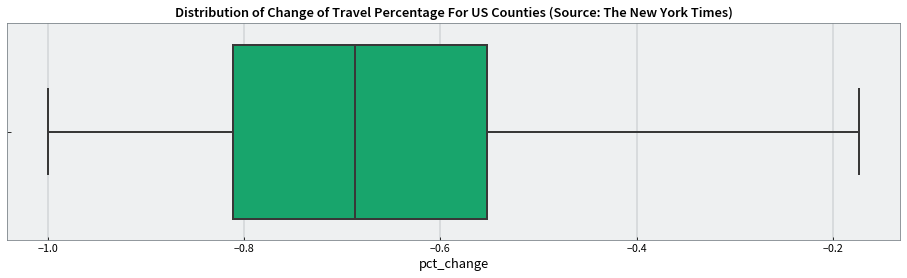

In [569]:
figsize(16, 4)
ax = sns.boxplot(x=travel_change_by_county['pct_change'], showfliers=False)
ax.set_title("Distribution of Change of Travel Percentage For US Counties (Source: The New York Times)")

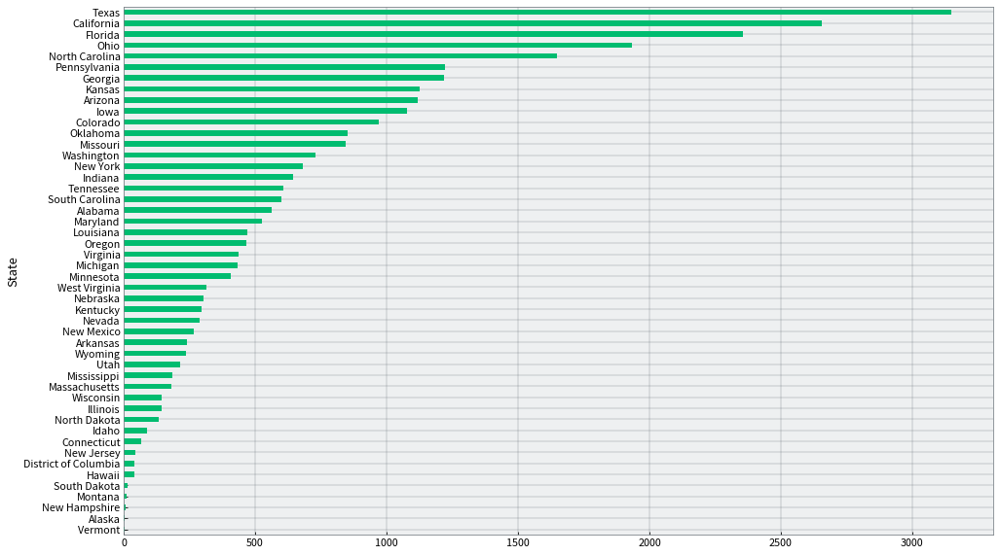

In [575]:
figsize(16, 10)
warehouses_with_social_distancing.groupby('State')['property_id'].count().sort_values().plot(kind='barh',
                                                                                             title="Number of US Warehouses By State")

In [596]:
figsize(16, 9)
alt.Chart(travel_change_by_county[-(travel_change_by_county['pct_change'] > 0)]).mark_circle().encode(
    alt.X('pct_change'),
    alt.Y('Warehouses'),
    size='pop',
    tooltip=['label:N',
             'Warehouses:Q']
).properties(
    width=1280,
    height=720
)

alt.Chart(...)

In [599]:
figsize(16, 9)
alt.Chart(travel_change_by_county[-(travel_change_by_county['pct_change'] > 0)]).mark_circle().encode(
    alt.X('pct_change'),
    alt.Y('total'),
    size='Warehouses',
    tooltip=['label:N',
             'Warehouses:Q',
             'pct_change:Q']
).properties(
    width=900,
    height=600
)

alt.Chart(...)

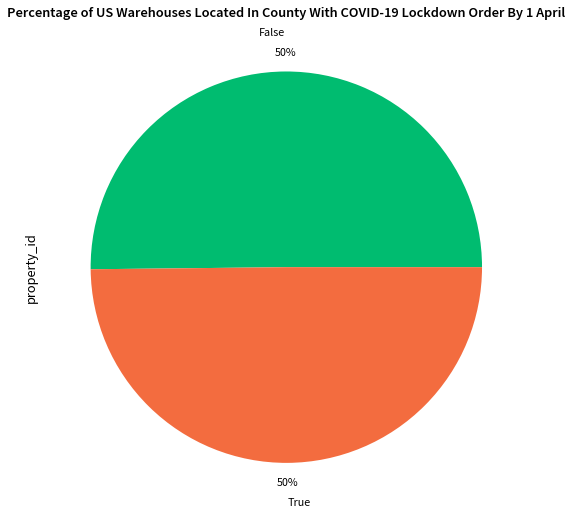

In [584]:
warehouses_with_social_distancing.groupby('in_lockdown')['property_id'].count().plot(kind='pie', autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2,
                                                                                     title="Percentage of US Warehouses Located In County With COVID-19 Lockdown Order By 1 April")

Text(0.5, 1.0, 'Distribution of Change in Travel For US Warehouses By Lockdown Order For County')

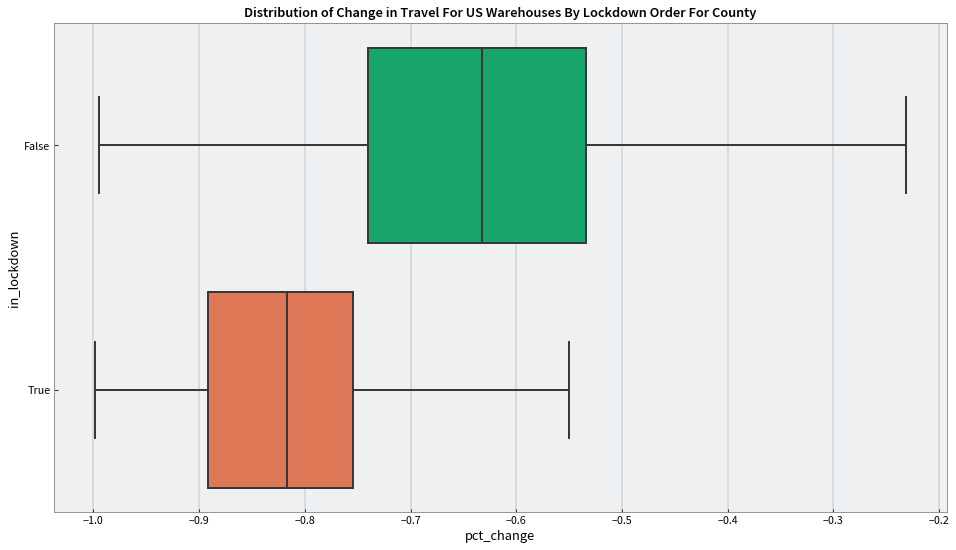

In [587]:
ax = sns.boxplot(y='in_lockdown', x='pct_change', data=warehouses_with_social_distancing, orient='h', showfliers=False)
ax.set_title("Distribution of Change in Travel For US Warehouses By Lockdown Order For County")

In [616]:
travel_change_by_county['pct_change'].quantile(q=[0.25, 0.5, 0.75])

0.25   -0.81100
0.50   -0.68700
0.75   -0.55225
Name: pct_change, dtype: float64

In [617]:
quartile_mapping = {1: ">81%",
                    2: "68-81%",
                    3: "55-68%",
                    4: "<55%"}

In [618]:
travel_change_by_county['Quartile of Travel'] = None

def classify_quartile_of_travel(row):
    quartiles = travel_change_by_county['pct_change'].quantile(q=[0.25, 0.5, 0.75]).values
    
    i = 1
    
    for quartile in quartiles:
        if row['pct_change'] >= quartile:
            i = i + 1
    
    row['Quartile of Travel'] = quartile_mapping[i]
    
    return row

travel_change_by_county = travel_change_by_county.swifter.apply(classify_quartile_of_travel, axis=1)

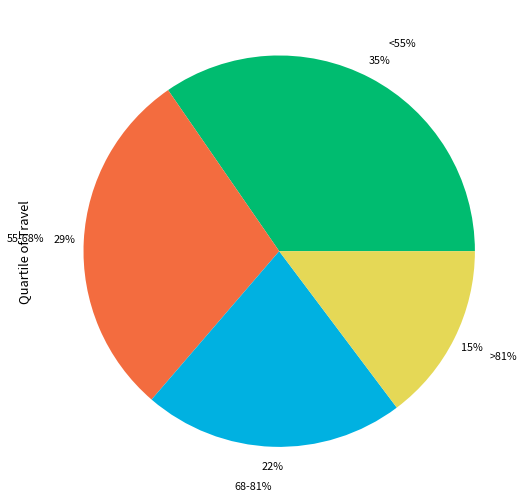

In [619]:
travel_change_by_county[travel_change_by_county['in_lockdown'] == False]['Quartile of Travel'].value_counts().plot(kind='pie', autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)

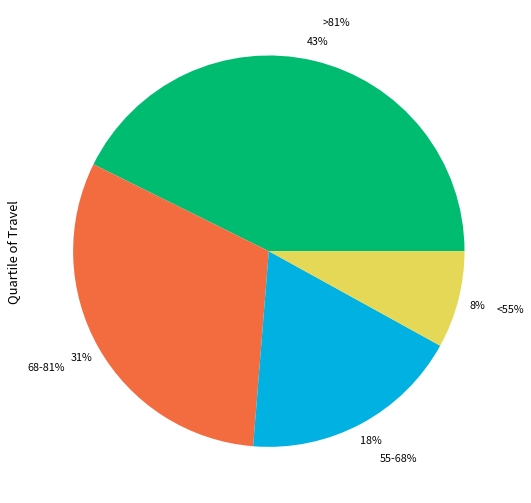

In [647]:
travel_change_by_county[travel_change_by_county['in_lockdown'] == True]['Quartile of Travel'].value_counts().plot(kind='pie', autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)

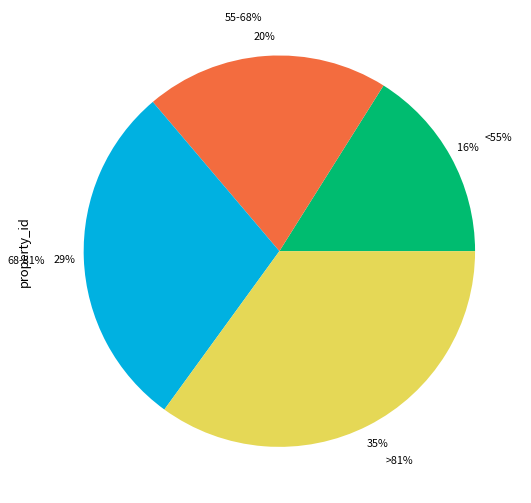

In [715]:
warehouses_with_social_distancing.groupby('Quartile of Travel')['property_id'].count().sort_values().plot(kind='pie', autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)

In [868]:
f = travel_change_by_county.groupby('Peak Hospitalization Date')['Warehouses'].sum().resample('W').sum().to_frame()
f['Peak Hospitalization'] = f['Warehouses']
del(f['Warehouses'])
f['Peak Death'] = travel_change_by_county.groupby('Peak Death Date')['Warehouses'].sum().resample('W').sum()
f.index = f.index.rename('Date')
f = f.reset_index()

,Date,Peak Hospitalization,Peak Death
0,2020-03-22,2,NaN
1,2020-03-29,12,90.0
2,2020-04-05,7446,1488.0
3,2020-04-12,8099,8042.0
4,2020-04-19,11343,6916.0
5,2020-04-26,3098,12973.0


In [871]:
f = f.melt(id_vars=['Date'], var_name='Peak', value_name="Warehouses")
f

,Date,Peak,Warehouses
0,2020-03-22,Peak Hospitalization,2.0
1,2020-03-29,Peak Hospitalization,12.0
2,2020-04-05,Peak Hospitalization,7446.0
3,2020-04-12,Peak Hospitalization,8099.0
4,2020-04-19,Peak Hospitalization,11343.0
5,2020-04-26,Peak Hospitalization,3098.0
6,2020-03-22,Peak Death,NaN
7,2020-03-29,Peak Death,90.0
8,2020-04-05,Peak Death,1488.0
9,2020-04-12,Peak Death,8042.0


In [875]:
alt.Chart(f[f['Date'] > '2020-03-29']).mark_bar().encode(
    x='Date:O',
    y=alt.Y('Warehouses:Q', stack=False),
    color='Peak'
).properties(
    width=900,
    height=600
)

alt.Chart(...)

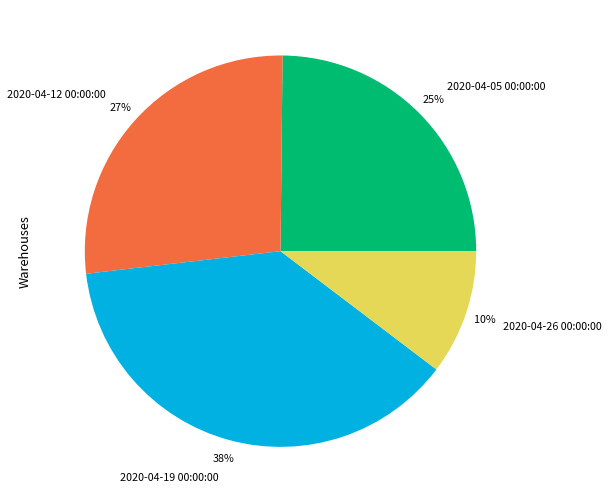

In [753]:
travel_change_by_county[travel_change_by_county['Peak Hospitalization Date'] >= '2020-03-29'].groupby('Peak Hospitalization Date')['Warehouses'].sum().resample('W').sum().plot(kind='pie', autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)

In [738]:
figsize(16, 9)
alt.Chart(travel_change_by_county[['label', 'Peak Hospitalization', 'Peak Hospitalization Date', 'Warehouses']]).mark_circle().encode(
    alt.Y('Peak Hospitalization:Q'),
    alt.X('Peak Hospitalization Date:T'),
    size='Warehouses:Q',
    tooltip=['label:N',
             'Warehouses:Q',
             'Peak Hospitalization:Q',
             'Peak Hospitalization Date:T']
).properties(
    width=900,
    height=600
)

alt.Chart(...)

In [740]:
travel_change_by_county['State Total COVID-19 Tests'] = travel_change_by_county['total']

In [741]:
figsize(16, 9)
alt.Chart(travel_change_by_county[['label', 'State Total COVID-19 Tests', 'Peak Hospitalization Date', 'Warehouses']]).mark_circle().encode(
    alt.Y('State Total COVID-19 Tests:Q'),
    alt.X('Peak Hospitalization Date:T'),
    size='Warehouses:Q',
    tooltip=['label:N',
             'Warehouses:Q',
             'State Total COVID-19 Tests:Q',
             'Peak Hospitalization Date:T']
).properties(
    width=900,
    height=600
)

alt.Chart(...)